#Pix2Pix



##모듈 및 라이브러리

In [ ]:
import tensorflow as tf

import os
import time

from matplotlib import pyplot as plt
from IPython import display

In [ ]:
!pip install -U tensorboard

     |████████████████████████████████| 6.0MB 34.8MB/s 
     |████████████████████████████████| 4.9MB 39.9MB/s 
  Found existing installation: tensorboard 2.4.1
    Uninstalling tensorboard-2.4.1:
      Successfully uninstalled tensorboard-2.4.1


##데이터 셋 로드 및 전처리 함수

In [ ]:
#프라하 체코 공과대학의 기계 인식 센터에서 제공하는 CMP Facade Database
'''_URL = 'https://people.eecs.berkeley.edu/~tinghuiz/projects/pix2pix/datasets/facades.tar.gz'
path_to_zip = tf.keras.utils.get_file('/content/drive/MyDrive/CGAN/facades.tar.gz',
                                      origin = _URL,
                                      extract=True,
                                      cache_subdir='/content/drive/MyDrive/CGAN/')
print(path_to_zip)
PATH = os.path.join(os.path.dirname(path_to_zip),'facades/')
print(PATH)'''

"_URL = 'https://people.eecs.berkeley.edu/~tinghuiz/projects/pix2pix/datasets/facades.tar.gz'\npath_to_zip = tf.keras.utils.get_file('/content/drive/MyDrive/CGAN/facades.tar.gz',\n                                      origin = _URL,\n                                      extract=True,\n                                      cache_subdir='/content/drive/MyDrive/CGAN/')\nprint(path_to_zip)\nPATH = os.path.join(os.path.dirname(path_to_zip),'facades/')\nprint(PATH)"

In [ ]:
_URL = 'https://people.eecs.berkeley.edu/~tinghuiz/projects/pix2pix/datasets/maps.tar.gz'
path_to_zip = tf.keras.utils.get_file('/content/drive/MyDrive/CGAN/maps.tar.gz',
                                      origin = _URL,
                                      extract=True,
                                      cache_subdir='/content/drive/MyDrive/CGAN/')
print(path_to_zip)
PATH = os.path.join(os.path.dirname(path_to_zip),'maps/')
print(PATH)

In [ ]:
PATH = '/content/drive/MyDrive/CGAN/maps/'

In [ ]:
BUFFER_SIZE = 400
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [ ]:
def load(image_file):
  image = tf.io.read_file(image_file)
  image = tf.image.decode_jpeg(image)
  #plt.imshow(image)

  w = tf.shape(image)[1]
  w = w // 2

  real_image = image[:, :w, :]
  input_image = image[:, w:, :]

  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image

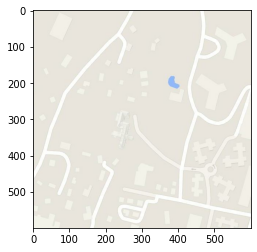

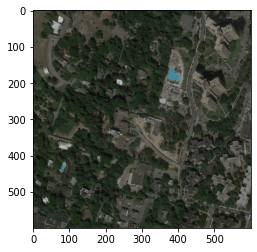

In [ ]:
inp, re = load(PATH+'train/100.jpg')
#casting to int for matplotlib to show the image
plt.figure()
plt.imshow(inp/255.0)
plt.figure()
plt.imshow(re/255.0)

In [ ]:
def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  #tf.image.ResizeMethod.NEAREST_NEIGHBOR : 최단입점 보간법, 가장 가까운 원본 픽셀을 선택하는 방법
  
  return input_image, real_image

In [ ]:
def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis = 0)
  cropped_image = tf.image.random_crop(
      stacked_image, size = [2, IMG_HEIGHT, IMG_WIDTH, 3])
  
  return cropped_image[0], cropped_image[1]

In [ ]:
#normalizing the images to [-1,1]

def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

In [ ]:
@tf.function()
def random_jitter(input_image, real_image):
  # resizing to 286 x 286 x 3
  input_image, real_image = resize(input_image, real_image, 286, 286)

  # randomly cropping to 256 x 256 x 3
  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    # random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image

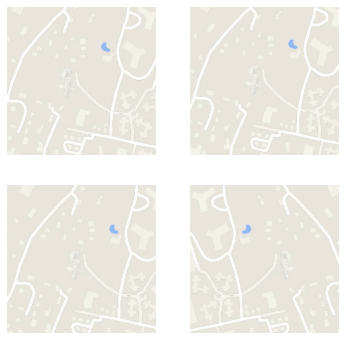

In [ ]:
plt.figure(figsize=(6,6))
for i in range(4):
  rj_inp, rj_re = random_jitter(inp, re)
  plt.subplot(2, 2, i+1)
  plt.imshow(rj_inp/255.0)
  plt.axis('off')
plt.show()

In [ ]:
def load_image_train(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)

  return real_image, input_image

In [ ]:
def load_image_test(image_file):
  #테스트에서는 지터링 불필요
  input_image, real_image = load(image_file)
  input_image, real_image = resize(input_image, real_image, IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)

  return real_image, input_image

In [ ]:
#maps에서만 추가
inp, re = resize(inp, re, 256, 256)

##입력 파이프라인

In [ ]:
train_dataset = tf.data.Dataset.list_files(PATH+'train/*.jpg')
train_dataset = train_dataset.map(load_image_train, num_parallel_calls=tf.data.experimental.AUTOTUNE)
#(Optional.) A tf.int32 scalar tf.Tensor, representing the number elements to process asynchronously in parallel. 
#If not specified, elements will be processed sequentially. 
#If the value tf.data.AUTOTUNE is used, then the number of parallel calls is set dynamically based on available CPU.
#프로세스를 CPU가 허용 가능한 만큼 동적으로 병렬로 수행
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [ ]:
test_dataset = tf.data.Dataset.list_files(PATH+'val/*.jpg')
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

## 생성자(U-Net)

In [ ]:
OUTPUT_CHANNELS = 3

In [ ]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))#(bs, input/strides, input/strides, filters)
  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())
  
  result.add(tf.keras.layers.LeakyReLU())

  return result

In [ ]:
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(inp, 0))
print(down_result.shape)

(1, 128, 128, 3)


In [ ]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                      padding='same',
                                      kernel_initializer=initializer,
                                      use_bias=False))
  
  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
    result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [ ]:
up_model = upsample(3, 4)
up_result = up_model(down_result)
print(up_result.shape)

(1, 256, 256, 3)


In [ ]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256,256,3])

  down_stack = [
                downsample(64, 4, apply_batchnorm=False), #(bs, 128, 128, 64)
                downsample(128, 4), # (bs, 64, 64, 128)
                downsample(256, 4), # (bs, 32, 32, 256)
                downsample(512, 4), # (bs, 16, 16, 512)
                downsample(512, 4), # (bs, 8, 8, 512)
                downsample(512, 4), # (bs, 4, 4, 512)
                downsample(512, 4), # (bs, 2, 2, 512)
                downsample(512, 4), # (bs, 1, 1, 512)
  ]

  up_stack = [
              upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 512+512)
              upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 512+512)
              upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 512+512)
              upsample(512, 4), # (bs, 16, 16, 512+512)
              upsample(256, 4), # (bs, 32, 32, 256+256)
              upsample(128, 4), # (bs, 64, 64, 128+128)
              upsample(64, 4), # (bs, 128, 128, 64+64)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh') # (bs, 256, 256, 3)
  x = inputs

  # Downsampling through the model
  skips=[]
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  #Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

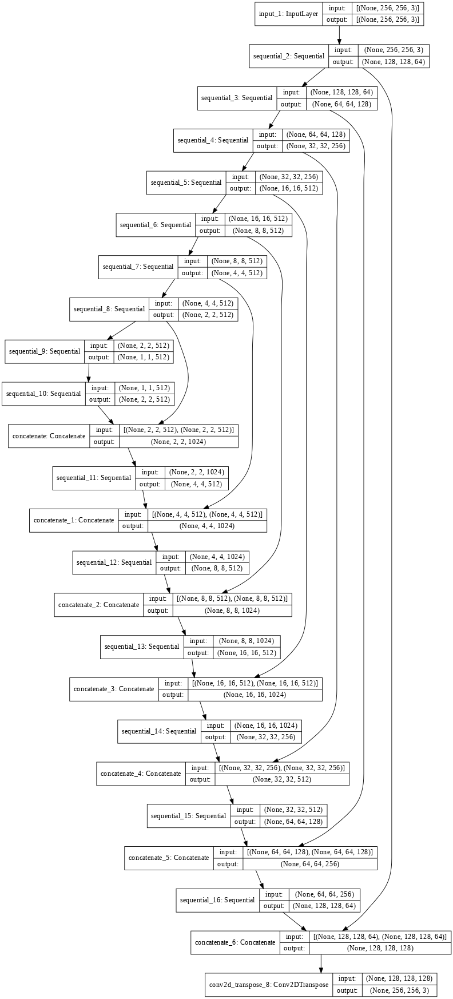

In [ ]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

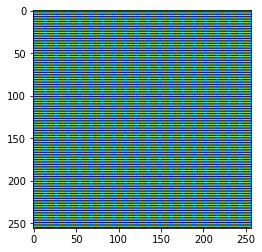

In [ ]:
gen_output = generator(inp[tf.newaxis,...], training=False)
plt.imshow(gen_output[0,...])

In [ ]:
LAMBDA = 100 # 논문작성자가 결정

In [ ]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output) # 생성된 이미지와 1의 배열의 시그모이드 교차 엔트로피 손실

  # mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output)) # 생성이미지와 대상 이미지 사이의 평균 절대 오차, 이를 통해 생성된 이미지와 타겟 이미지가 구조적으로 유사해짐

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

## 판별자(PatchGAN)

In [ ]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name = 'input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name = 'target_image')

  x = tf.keras.layers.concatenate([inp, tar]) # (bs, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
  down2 = downsample(128,4)(down1) # (bs, 64, 64, 128)
  down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1) # (bs, 31, 31, 512)
  
  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)
  
  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

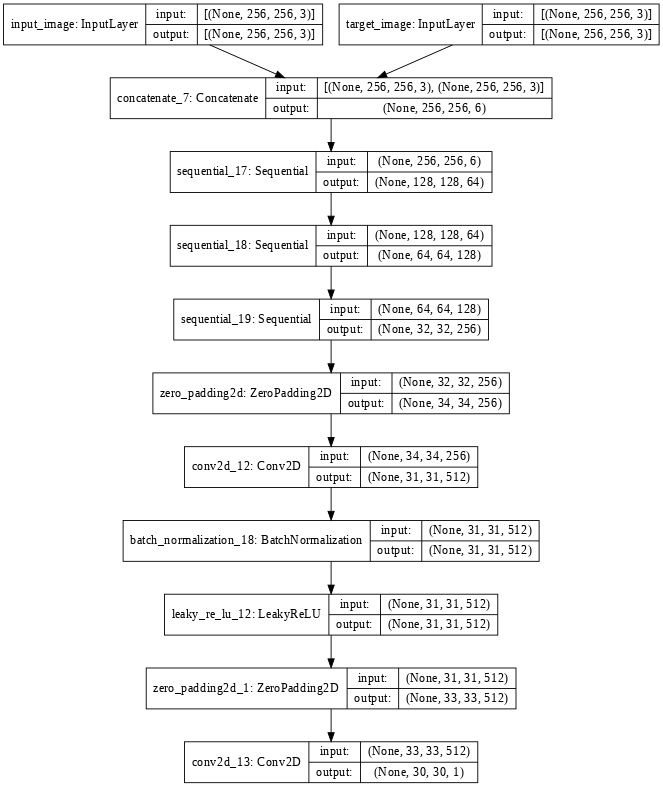

In [ ]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

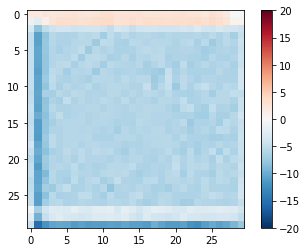

In [ ]:
disc_out = discriminator([inp[tf.newaxis,...], gen_output], training=False)
plt.imshow(disc_out[0,...,-1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

In [ ]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output) # 잔짜 이미지와 1의 배열의 시그모이드 교차 엔트로피 손실

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output) # 생성된 이미지와 0의 배열의 시그모이드 교차 엔트로피 손실

  total_disc_loss = real_loss + generated_loss
  
  return total_disc_loss

## Optimizer 및 체크포인트 정의

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5) # learning_rate(학습률) : 0.0002, beta_1=0.5
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

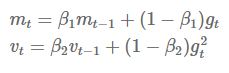

In [ ]:
checkpoint_dir = '/content/drive/MyDrive/CGAN/maps/training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [ ]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

## 이미지 생성하기

In [ ]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Groun Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    #getting the pixel values between [0, 1] to plot it
    plt.imshow(display_list[i] *  0.5 + 0.5)
    plt.axis('off')
  plt.show()

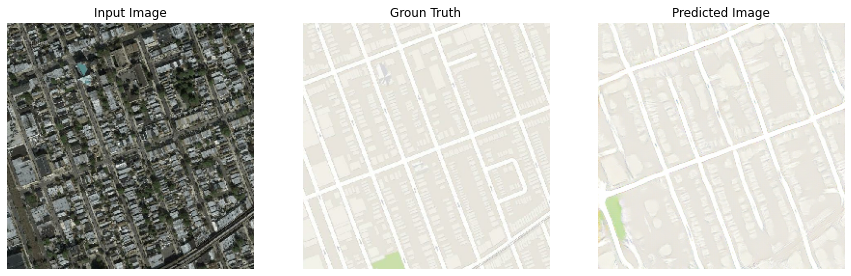

In [ ]:
for example_input, example_target in test_dataset.take(1):
  generate_images(generator, example_input, example_target)

## 훈련하기

In [ ]:
EPOCHS = 150

In [ ]:
import datetime
log_dir = "/content/drive/MyDrive/CGAN/maps/logs/"
summary_writer = tf.summary.create_file_writer(
    log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
)

In [ ]:
@tf.function
def train_step(input_image, target, epoch) :
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    #예측
    gen_output = generator(input_image, training = True)

    disc_real_output = discriminator([input_image, target], training = True)
    disc_generated_output = discriminator([input_image, gen_output], training= True)
    
    #loss값 계산
    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  #기울기 계산
  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)
  
  #오차 역전파
  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))
  
  #TenosorBoard에 기록
  with summary_writer.as_default(): 
    tf.summary.scalar('gen_total_loss', gen_total_loss, step = epoch)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=epoch)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=epoch)
    tf.summary.scalar('disc_loss', disc_loss, step=epoch)

In [ ]:
print(test_dataset)

<BatchDataset shapes: ((None, 256, 256, None), (None, 256, 256, None)), types: (tf.float32, tf.float32)>


In [ ]:
print(test_dataset.take(1))

<TakeDataset shapes: ((None, 256, 256, None), (None, 256, 256, None)), types: (tf.float32, tf.float32)>


In [ ]:
def fit(train_ds, epochs, test_ds):
  for epoch in range(epochs):
    start = time.time()

    display.clear_output(wait=True)

    for example_input, example_target in test_ds.take(1):
      generate_images(generator, example_input, example_target)
    print("Epoch : ", epoch)

    # 훈련
    for n, (input_image, target) in train_ds.enumerate():
      print('.', end = '')
      if (n+1) % 100 == 0:
        print()
      train_step(input_image, target, epoch)
    print()

    # 20 epoch마다 저장
    if (epoch + 1) % 20 == 0:
      checkpoint.save(file_prefix = checkpoint_prefix)

    print('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                       time.time()-start))
  checkpoint.save(file_prefix = checkpoint_prefix)

In [ ]:
%load_ext tensorboard
%tensorboard --logdir {log_dir}

<IPython.core.display.Javascript object>

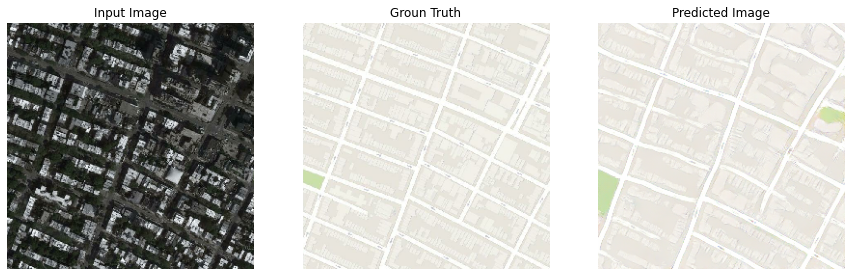

Epoch :  149
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
..............................................................................

In [ ]:
fit(train_dataset, EPOCHS, test_dataset)

Epoch 100

In [ ]:
ls {checkpoint_dir}

checkpoint                   ckpt-3.data-00000-of-00001
ckpt-10.data-00000-of-00001  ckpt-3.index
ckpt-10.index                ckpt-4.data-00000-of-00001
ckpt-11.data-00000-of-00001  ckpt-4.index
ckpt-11.index                ckpt-5.data-00000-of-00001
ckpt-12.data-00000-of-00001  ckpt-5.index
ckpt-12.index                ckpt-6.data-00000-of-00001
ckpt-13.data-00000-of-00001  ckpt-6.index
ckpt-13.index                ckpt-7.data-00000-of-00001
ckpt-14.data-00000-of-00001  ckpt-7.index
ckpt-14.index                ckpt-8.data-00000-of-00001
ckpt-1.data-00000-of-00001   ckpt-8.index
ckpt-1.index                 ckpt-9.data-00000-of-00001
ckpt-2.data-00000-of-00001   ckpt-9.index
ckpt-2.index


In [ ]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

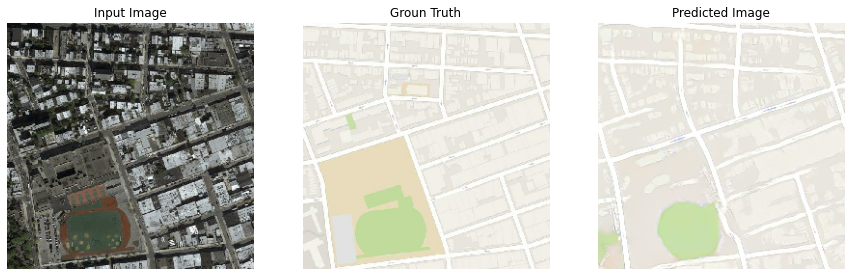

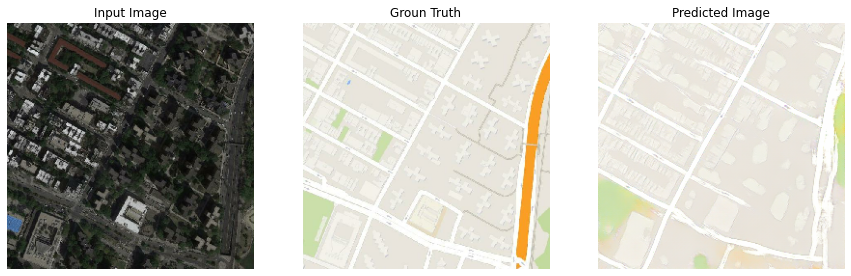

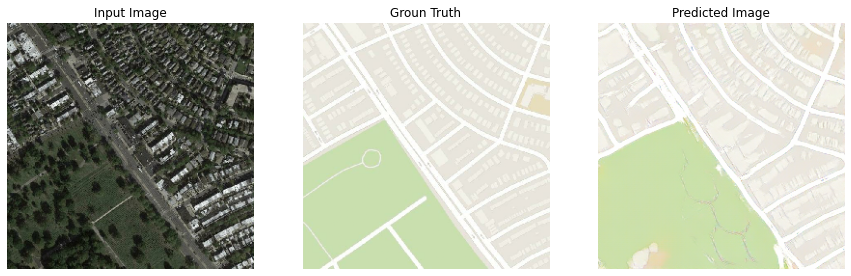

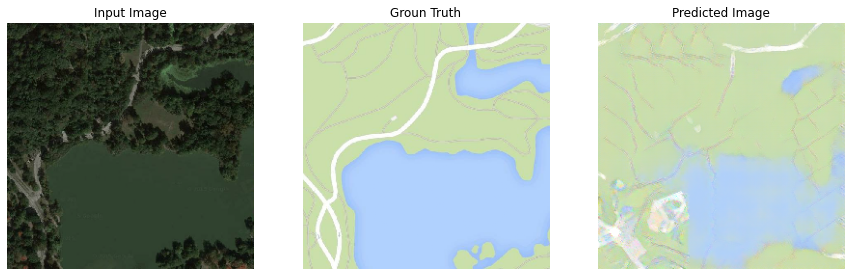

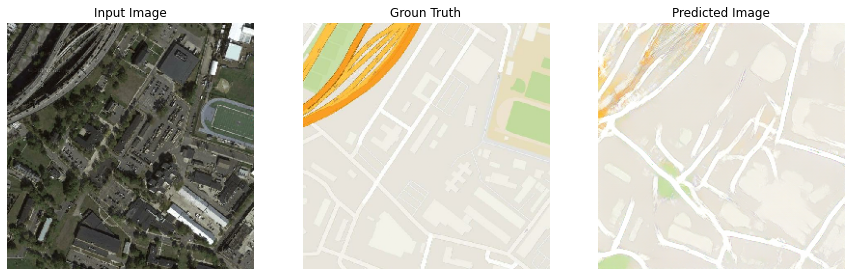

In [ ]:
for inp, tar in test_dataset.take(5):
  generate_images(generator, inp, tar)